# Self-Similarity Priors: Neural Collages as Differentiable Fractal Representations

Michael Poli *, Winnie Xu *, Stefano Massaroli *, Chenlin Meng, Kuno Kim, Stefano Ermon

[paper](https://arxiv.org/abs/2204.07673#:~:text=Self%2DSimilarity%20Priors%3A%20Neural%20Collages%20as%20Differentiable%20Fractal%20Representations,-Michael%20Poli%2C%20Winnie&text=Many%20patterns%20in%20nature%20exhibit,described%20via%20self%2Dreferential%20transformations.) | [code](https://github.com/ermongroup/self-similarity-prior) | [demo](https://huggingface.co/spaces/Zymrael/Neural-Collage-Fractalization)

# Neural Collage Operators
Neural Collage Operators produce a fractal code: a set of parameters to a contraction map (Lipschitz constant < 1) with its attractor (fixed-point) corresponding to a desired data point. We refer to this contraction operator as a Collage Operator. Each fractal code *uniquely* identifies a data point.

## Applications of Fractal Codes

1. Compression: train your `Neural Collage Operator` on a dataset; at test time, produce the fractal code (forward encoding problem), and serialize it. To obtain the original data point, decode the collage parameters to the fixed-point.
2. Learning: as an intermediate representation.
3. Generation: as latent variables in a deep generative models.
4. Art: to "fractalize" data.

# Setup

In [1]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

%load_ext autoreload 
%autoreload 2

## 2D Neural Collage Operator

In [2]:
from torch_src.collage import NeuralCollageOperator2d

# Learning Collage Representations of Image Data

## Load example image

In [3]:
import tensorflow as tf
import os

image_path = tf.keras.utils.get_file(
      'einstein375.png',
      'https://firebasestorage.googleapis.com/v0/b/sde-bnn.appspot.com/o/neural-collage%2Feinstein375.png?alt=media&token=e2160ac0-c88a-4f62-9ccd-86de5476d82e',
      extract=True)
image_path = os.path.join(os.path.dirname(image_path), 'einstein375.png')

2023-10-25 15:28:38.865023: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
im = Image.open(image_path)
im = np.asarray(im)
im = torch.from_numpy(im).permute(2, 0, 1).unsqueeze(0)[:, :3]

/var/folders/10/14qcnk6n7cv_qqnzk6h8f43w0000gn/T/ipykernel_82444/47979535.py:3: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:212.)
  im = torch.from_numpy(im).permute(2, 0, 1).unsqueeze(0)[:, :3]


## Train a Neural Collage

In [5]:
out_res=375 #@param
out_channels=3 #@param
range_patch_height=5 #@param
range_patch_width=5 #@param
domain_patch_height=375 #@param
domain_patch_width=375 #@param

n_iterations = 200 #@param
n_decode_steps = 10 #@param
return_co_code = False #@param

In [6]:
co = NeuralCollageOperator2d(out_res=out_res, out_channels=out_channels, rh=range_patch_height, rw=range_patch_width, dh=domain_patch_height, dw=domain_patch_width, use_augmentations=False)

In [7]:
# Train the collage operator encoder
opt = torch.optim.Adam(co.parameters(), lr=1e-2)
objective = nn.MSELoss()
norm_im = im.float() / 255

for k in range(n_iterations):
    recon = co(norm_im, decode_steps=n_decode_steps, return_co_code=return_co_code)
    loss = objective(recon, norm_im)
    print(f'Reconstruction MSE: {loss}', end='\r')
    loss.backward()
    opt.step()
    opt.zero_grad()

## Visualize the Fixed Point

1) The Neural Collage Operator encoder produces the fractal code for `norm_im`

2) The reconstruction is produced as the fixed point of the Collage Operator with the given fractal code

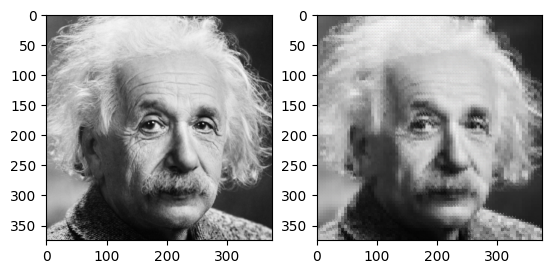

In [8]:
recon = co(norm_im, decode_steps=10)

fig, axs = plt.subplots(1, 2)
axs[0].imshow(norm_im[0].permute(1,2,0), cmap='bone')
axs[1].imshow(recon[0].permute(1,2,0).detach(), cmap='bone')

## View Fractal Code

Set `return_co_code=True` to obtain the number of bytes required to serialize the fractal code. 

From an image compression standpoint, we may employ additional methods to optimize the code length of fractal codes for Neural Collage Operators.

One compression strategy (further details in our paper) involves L2-regularization on fractal weights to shrink their range, which enables efficient bit packing. 

As a rule of thumb, the simplest compression codec based on Neural Collage Operators is expected to have higher compression ratios (e.g, PSNR / bits per dim) than the comparable fractal compression scheme and also neural implicit compressors (COIN), with slightly less efficiency at med-level and higher bits per dim compared to block DCT-II. 

Neural Collages are much faster than fractal compression and COIN in the forward encoding phase, but there is still much room for improvement!

In [9]:
_, fractal_weight, fractal_bias = co(norm_im, decode_steps=10, return_co_code=True)
size_fractal_code = ( torch.numel(fractal_weight) + torch.numel(fractal_bias) )
raw_img_size = torch.numel(im)
print(f'Ratio: size fractal code / size of raw image is {size_fractal_code / raw_img_size}')

Ratio: size fractal code / size of raw image is 0.12


## Fractal Decoding

An interesting property of Collage Operators (and hence Neural Collage Operators) is the ability to decode, given a fractal code, at any resolution.

For the sake of practicality, our implementation is restricted to resolutions that are multiples of the original image resolution.
Pass this "super resolution factor" as `superres_factor`.

### Decode at 4 times the original 375 x 375 resolution... 


In [10]:
superres_factor = 4 #@param

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


original image size: torch.Size([1, 3, 375, 375]) | super-resolved image: torch.Size([1, 3, 1500, 1500])


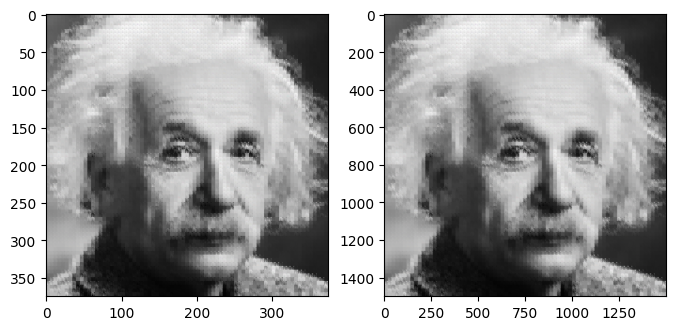

In [11]:
recon_sup = co(norm_im, decode_steps=10, superres_factor=superres_factor)
print(f'original image size: {norm_im.shape} | super-resolved image: {recon_sup.shape}')

fig, axs = plt.subplots(1, 2, figsize=(8,8))
axs[0].imshow(recon[0].permute(1,2,0).detach(), cmap='bone')
axs[1].imshow(recon_sup[0].permute(1,2,0).detach(), cmap='bone')

### zooming in... 👀 Einstein made of Einsteins?

This example shows the "fractalness" of the code representations produced by a Neural Collage Operator.

In other words, we see similar data appearing at different scales of resolution!
 
The additional visual details introduced by decoding at higher resolutions are based on the image itself. If decoding at even larger resolutions, it is possible to see multiple levels of "fractalness" when decoding at larger resolutions (see Figure 1 and Figure 13 in the paper). 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


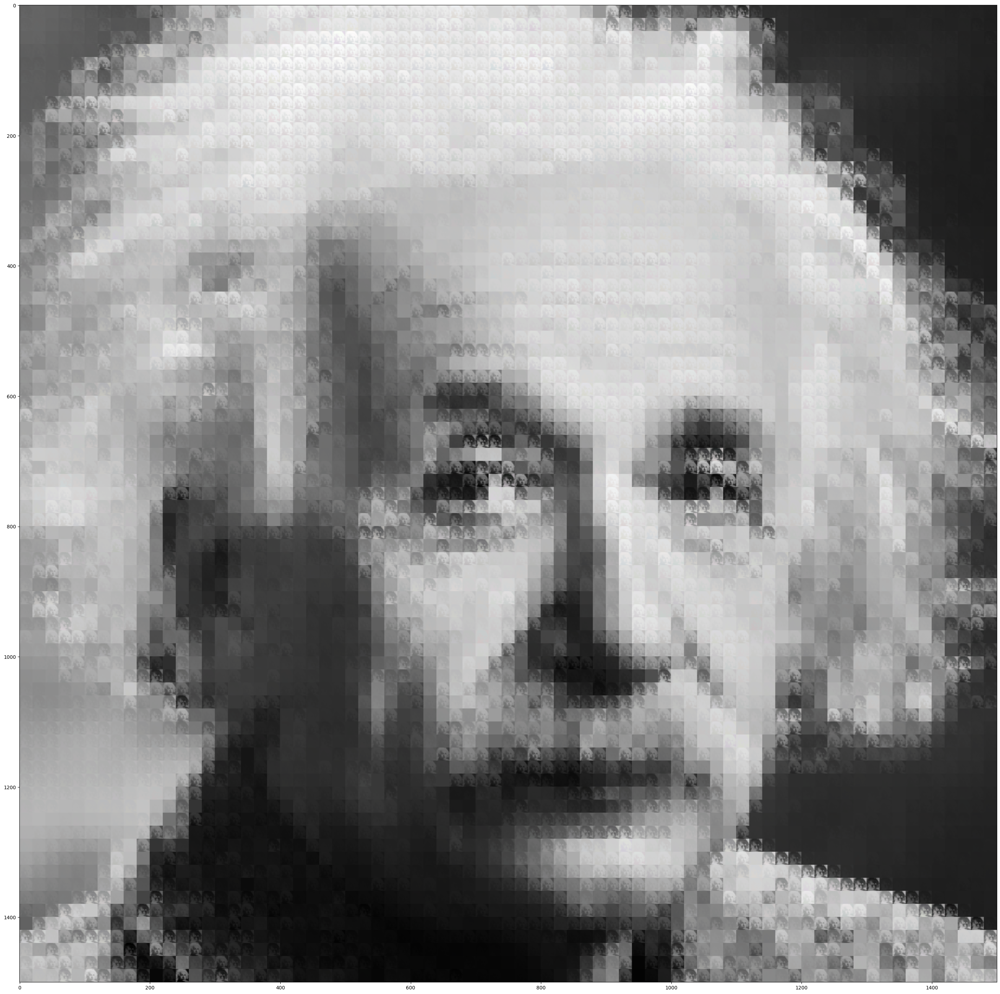

In [12]:
plt.figure(figsize=(36,36))
plt.imshow(recon_sup[0].permute(1,2,0).detach(), cmap='bone')

## Adding Augmentations

Set `use_augmentations=True` while training the Collage Operator encodings to obtain a similar effect but with even more interesting details in the decoded image.

In [13]:
use_augmentations = True #@param

In [14]:
co = NeuralCollageOperator2d(out_res=out_res, out_channels=out_channels, rh=range_patch_height, rw=range_patch_width, dh=domain_patch_height, dw=domain_patch_width, use_augmentations=use_augmentations)

opt = torch.optim.Adam(co.parameters(), lr=1e-2)
objective = nn.MSELoss()
norm_im = im.float() / 255

for k in range(n_iterations):
    recon = co(norm_im, decode_steps=n_decode_steps, return_co_code=False)
    loss = objective(recon, norm_im)
    print(f'Reconstruction MSE: {loss}', end='\r')
    loss.backward()
    opt.step()
    opt.zero_grad()

/Users/hotaru/miniconda3/envs/self-similarity-prior-py39/lib/python3.9/site-packages/torch/_functorch/deprecated.py:58: UserWarning: We've integrated functorch into PyTorch. As the final step of the integration, functorch.vmap is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.vmap instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html
  warn_deprecated('vmap', 'torch.vmap')


construction MSE: 0.01975530944764614Reconstruction MSE: 0.020697569474577904Reconstruction MSE: 0.02070080116391182Reconstruction MSE: 0.018240464851260185Reconstruction MSE: 0.014203716069459915Reconstruction MSE: 0.010016622953116894Reconstruction MSE: 0.008884213864803314Reconstruction MSE: 0.01034057978540659Reconstruction MSE: 0.008643758483231068Reconstruction MSE: 0.006963842082768679Reconstruction MSE: 0.007160363253206015Reconstruction MSE: 0.007491708733141422Reconstruction MSE: 0.007178520783782005Reconstruction MSE: 0.006481947842985392Reconstruction MSE: 0.00601241085678339Reconstruction MSE: 0.006003373768180609Reconstruction MSE: 0.005934160202741623Reconstruction MSE: 0.005547326989471912Reconstruction MSE: 0.005316924769431353Reconstruction MSE: 0.005314464680850506Reconstruction MSE: 0.005258492659777403Reconstruction MSE: 0.005094143096357584Reconstruction MSE: 0.004945612046867609Reconstruction MSE: 0.004863013979047537Reconstruction MSE: 0.004795278422534466Recons

### zooming in to the details...

Notice the added clarity of additional details / textures in the example to the right.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


original image size: torch.Size([1, 3, 375, 375]) | super-resolved image: torch.Size([1, 3, 1500, 1500])


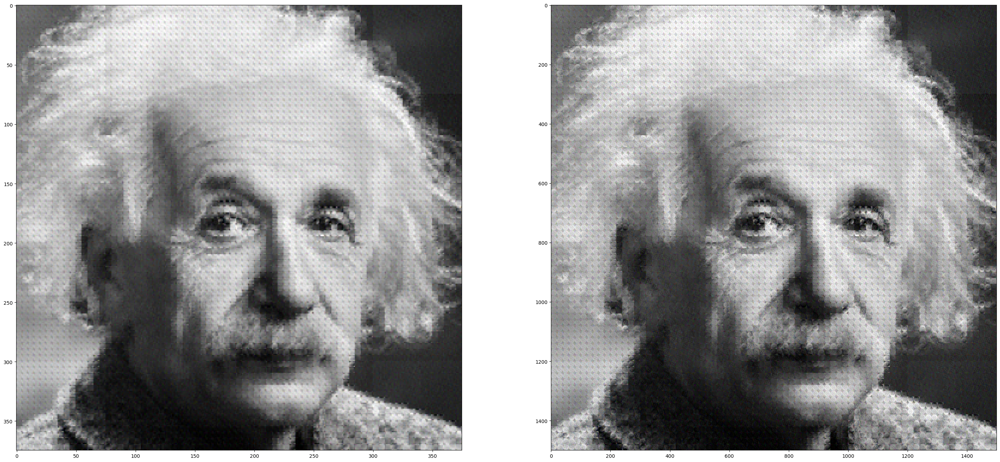

In [15]:
recon = co(norm_im, decode_steps=10)
recon_sup = co(norm_im, decode_steps=10, superres_factor=4)
print(f'original image size: {norm_im.shape} | super-resolved image: {recon_sup.shape}')

fig, axs = plt.subplots(1, 2, figsize=(36, 36))
axs[0].imshow(recon[0].permute(1,2,0).detach(), cmap='bone')
axs[1].imshow(recon_sup[0].permute(1,2,0).detach(), cmap='bone')